# Forest fire dataset EDA

### 1. Wczytanie bibliotek i danych

#### 1.1 Wczytanie bibliotek

In [1]:
import pandas as pd
import numpy as np

from matplotlib import pyplot as plt
import seaborn as sns

#### 1.2 Wczytanie danych

In [2]:
df = pd.read_csv("forest_fires_dataset.csv")
attrib = pd.read_csv("attributes_forest_fires.csv")

df

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51.0,6.7,0.0,0.00
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33.0,0.9,0.0,0.00
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33.0,1.3,0.0,0.00
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97.0,4.0,0.2,0.00
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99.0,1.8,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,aug,sun,81.6,56.7,665.6,1.9,27.8,32.0,2.7,0.0,6.44
513,2,4,aug,sun,81.6,56.7,665.6,1.9,21.9,71.0,5.8,0.0,54.29
514,7,4,aug,sun,81.6,56.7,665.6,1.9,21.2,70.0,6.7,0.0,11.16
515,1,4,aug,sat,94.4,146.0,614.7,11.3,25.6,42.0,4.0,0.0,0.00


Z opisu wykonanego przez autora danych wiadomo, że w zbiorze nie ma brakujących wartości.

#### 1.3 Opis i typy kolumn

In [3]:
attrib

,name,type,description
0,X,integer,x-axis spatial coordinate within the Montesinh...
1,Y,integer,y-axis spatial coordinate within the Montesinh...
2,month,string,month of the year: 'jan' to 'dec'
3,day,string,day of the week: 'mon' to 'sun'
4,FFMC,float,FFMC index from the FWI system: 18.7 to 96.20
5,DMC,float,DMC index from the FWI system: 1.1 to 291.3
6,DC,float,DC index from the FWI system: 7.9 to 860.6
7,ISI,float,ISI index from the FWI system: 0.0 to 56.10
8,temp,float,temperature in Celsius degrees: 2.2 to 33.30
9,RH,float,relative humidity in %: 15.0 to 100


### 2 Analiza

In [4]:
df.describe()

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,4.669246,4.299807,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292
std,2.313778,1.229900,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818
min,1.000000,2.000000,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000
25%,3.000000,4.000000,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000
50%,4.000000,4.000000,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000
75%,7.000000,5.000000,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000
max,9.000000,9.000000,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000


Indeksy **DMC** i **DC** mają dużą wariancję. <br />
W kolumnie **rain** w większości są zera.

W kolumnie **area** również występuje dużo zer, możemy więc spróbować przetransformować ją logarytmicznie.

In [5]:
df["month"].value_counts()

aug    184
sep    172
mar     54
jul     32
feb     20
jun     17
oct     15
apr      9
dec      9
may      2
jan      2
nov      1
Name: month, dtype: int64

Większość pożarów występuje w drugiej połowie lata tj. **sierpień** oraz **wrzesień**.

In [6]:
df["day"].value_counts()

sun    95
fri    85
sat    84
mon    74
tue    64
thu    61
wed    54
Name: day, dtype: int64

W okresie weekendu występuje więcej pożarów.

#### 2.1 Rozkłady

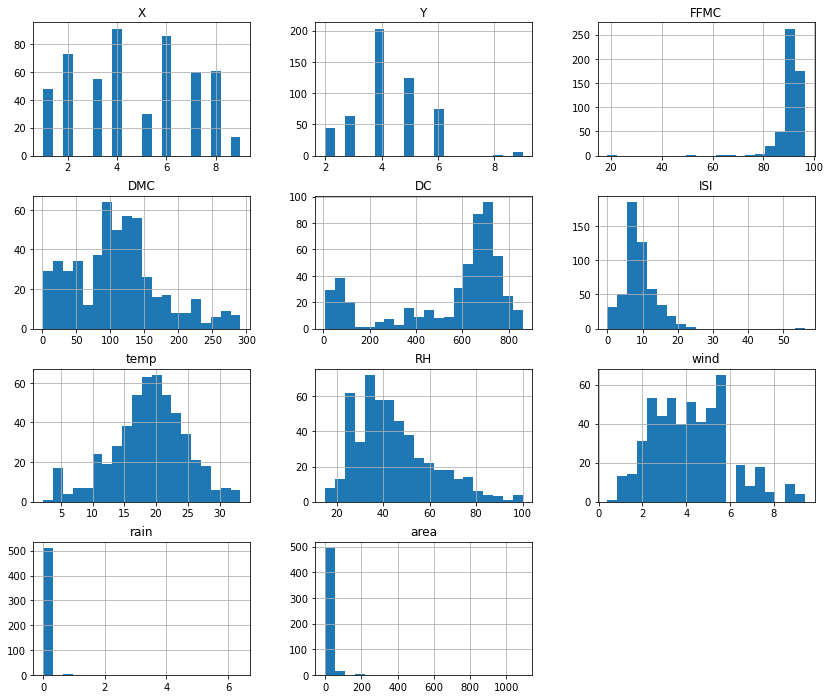

In [7]:
df.hist(figsize=(14, 12), bins=20)
plt.show()

Poza **FFMC**, wszystkie współczynniki oraz temperatura i wilgotność mają rozkład zbliżony do rozkładu normalnego. <br />
**rain** oraz **area** jak wcześniej zauważono są blisko zera.

Intersuje nas głównie kolumna **area**, aby poprawić dane można usunąć wartości odstające.

In [8]:
area = df["area"]

upper_lim = area.quantile(.95)
lower_lim = area.quantile(.05)

data_percentile = area[(area < upper_lim) & (area > lower_lim)]

print('Wejściowy rozmiar: ', area.shape[0])
print('Wyjściowy rozmiar: ', data_percentile.shape[0])
print('Pozostało: ', round(data_percentile.shape[0] / area.shape[0], 2) * 100, '%', sep='')

Wejściowy rozmiar:  517
Wyjściowy rozmiar:  244
Pozostało: 47.0%


In [9]:
# porzucenie wierszy z outlierami w area oraz przekształcenie logarytmicznie kolumny

df = df[ df["area"].isin(data_percentile) ] 
df["area"] = np.log1p(df["area"]) 

df

<ipython-input-9-e29723587456>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["area"] = np.log1p(df["area"])


,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
138,9,9,jul,tue,85.8,48.3,313.4,3.9,18.0,42.0,2.7,0.0,0.307485
139,1,4,sep,tue,91.0,129.5,692.6,7.0,21.7,38.0,2.2,0.0,0.357674
140,2,5,sep,mon,90.9,126.5,686.5,7.0,21.9,39.0,1.8,0.0,0.385262
141,1,2,aug,wed,95.5,99.9,513.3,13.2,23.3,31.0,4.5,0.0,0.438255
142,8,6,aug,fri,90.1,108.0,529.8,12.5,21.2,51.0,8.9,0.0,0.476234
...,...,...,...,...,...,...,...,...,...,...,...,...,...
505,1,2,aug,thu,91.0,163.2,744.4,10.1,26.7,35.0,1.8,0.0,1.916923
509,5,4,aug,fri,91.0,166.9,752.6,7.1,21.1,71.0,7.6,1.4,1.153732
510,6,5,aug,fri,91.0,166.9,752.6,7.1,18.2,62.0,5.4,0.0,0.357674
512,4,3,aug,sun,81.6,56.7,665.6,1.9,27.8,32.0,2.7,0.0,2.006871


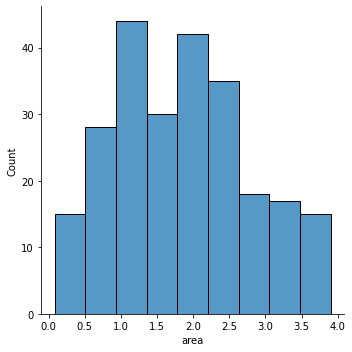

In [10]:
sns.displot(df["area"])

plt.show()

### 2.3 Korelacje

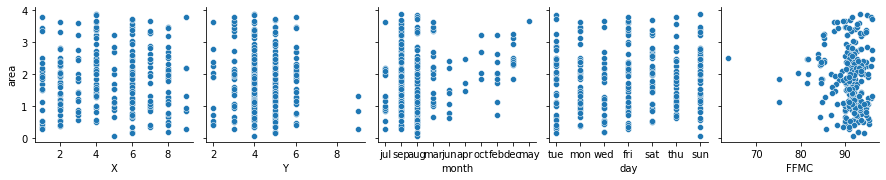

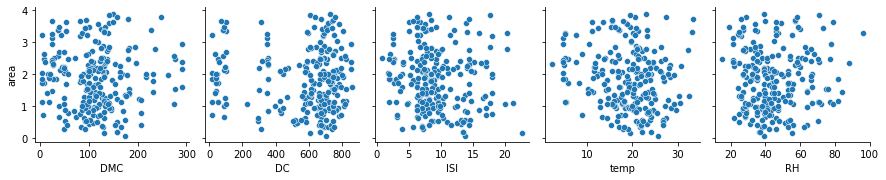

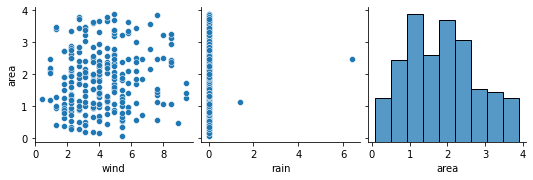

In [11]:
sns.pairplot(df, y_vars="area", x_vars=df.columns.values[:5])
sns.pairplot(df, y_vars="area", x_vars=df.columns.values[5:10])
sns.pairplot(df, y_vars="area", x_vars=df.columns.values[10:])

plt.show()

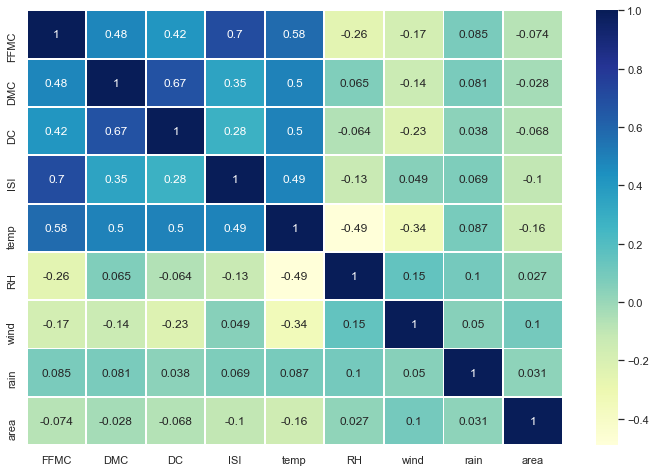

In [12]:
corr = df.loc[:, "FFMC":].corr()

sns.set(rc={'figure.figsize':(12, 8.)})

sns.heatmap(corr, annot=True, linewidths=.75, cmap="YlGnBu")

plt.show()

**area** jest najbardziej skorelowana z **wind** jednak nadal jesto tylko 0.1, z pozostałymi jest słabo skorelowana.

## 4. Zautomatyzowana EDA

In [13]:
from pandas_profiling import ProfileReport

df = pd.read_csv('forest_fires_dataset.csv')

ProfileReport(df, explorative=True)

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Plusy**:
- szybkość użycia
- można zauważyć jakieś pierwsze związki między zmiennymi, które można bardziej zbadać ręcznie.

**Minusy**:
- w tym wypadku cała analiza jest robiona na nieprzekształconej kolumnie area, w której prawie połowa to outliery